<a href="https://colab.research.google.com/github/ronenfilho/ia_ifg_picking/blob/main/IFG_Dic_IA_Projeto_Picking_20250519.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Projeto
## DONE
  - Versão 1: Profundidade com 4 direções
  - Versão 2: Profundidade com 8 direções
  - Versão 3: Escolha a quantidade de produtos e o método de busca
  - Processamento de estastísticas (básica)

## TODO
  - Revisão das versões e sugestões
  - Processamento de estastísticas (melhorar)  


  
Versão 1: Profundidade com 4 direções

,Produto,Endereço
0,Produto A,04(E)-04
1,Produto B,10(D)-07
2,Produto C,06(D)-01


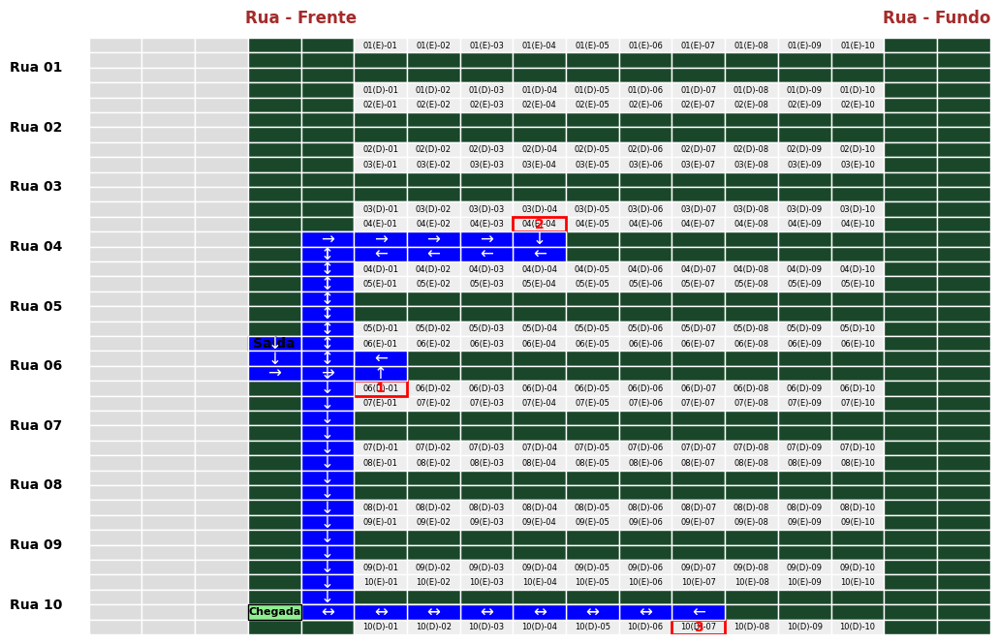

In [40]:
# Instalações necessárias (execute no início da célula)
!pip install pillow

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
from collections import deque, defaultdict
from matplotlib.patches import Rectangle
from matplotlib import animation
from IPython.display import HTML, display

# --------- Configuração do Galpão: 10 ruas ---------
random.seed(42)
num_streets = 10
corridor_height = 2
spacing_height = 2
avenue_width = 2
lockers_per_side = 10
offset = 1
separation_width = 3

# Dimensões do grid
orig_h = (num_streets + 1) * spacing_height + num_streets * corridor_height
width = separation_width + avenue_width*2 + lockers_per_side
height = orig_h - 2*offset
sa = separation_width

# Monta grid de circulação (1 = rua/avenida)
grid = np.zeros((orig_h, width), dtype=int)
grid[:, sa:sa+avenue_width] = 1
grid[:, width-avenue_width:width] = 1
for i in range(num_streets):
    r0 = spacing_height + i*(corridor_height+spacing_height)
    grid[r0:r0+corridor_height, sa:width-avenue_width] = 1
gv = grid[offset:-offset, :]

# --------- Geração de endereços de armários ---------
addresses = {}
for i in range(num_streets):
    vs = spacing_height + i*(corridor_height+spacing_height) - offset
    for j in range(lockers_per_side):
        c = sa + avenue_width + j
        addresses[(vs-1, c)] = f"{i+1:02d}(E)-{j+1:02d}"
        addresses[(vs+corridor_height, c)] = f"{i+1:02d}(D)-{j+1:02d}"

# --------- Pedido aleatório de 1 a 5 produtos ---------
n = random.randint(3, 3)
positions = list(addresses.keys())
random.shuffle(positions)
selected = positions[:n]
produtos = [f"Produto {chr(65+i)}" for i in range(n)]
pedido = pd.DataFrame({
    "Produto": produtos,
    "Endereço": [addresses[pos] for pos in selected]
})
display(pedido)

# --------- Função BFS - busca em largura (BFS) num grid binário ---------
def bfs_path(grid, start, goal):
    rows, cols = grid.shape
    visited = np.zeros_like(grid, bool)
    prev = {}
    q = deque([start]); visited[start] = True
    while q:
        r, c = q.popleft()
        if (r, c) == goal:
            path = []
            while (r, c) != start:
                path.append((r, c))
                r, c = prev[(r, c)]
            path.append(start)
            return path[::-1]
        for dr, dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            nr, nc = r+dr, c+dc
            if 0 <= nr < rows and 0 <= nc < cols and not visited[nr,nc] and grid[nr,nc] == 1:
                visited[nr,nc] = True
                prev[(nr,nc)] = (r, c)
                q.append((nr, nc))
    return []

# --------- A* 8-direções com heurística Manhattan ---------
def astar8_manhattan(grid, start, goal):
    rows, cols = grid.shape
    moves = [(1,0),(-1,0),(0,1),(0,-1),(1,1),(1,-1),(-1,1),(-1,-1)]
    open_set = [(0 + abs(start[0]-goal[0]) + abs(start[1]-goal[1]), 0, start)]
    came_from = {}
    gscore = defaultdict(lambda: np.inf)
    gscore[start] = 0
    visited = set()
    while open_set:
        f, g, current = heapq.heappop(open_set)
        if current == goal:
            path = []
            while current != start:
                path.append(current)
                current = came_from[current]
            path.append(start)
            return path[::-1]
        if current in visited:
            continue
        visited.add(current)
        for dr, dc in moves:
            nr, nc = current[0] + dr, current[1] + dc
            if 0 <= nr < rows and 0 <= nc < cols and grid[nr, nc] == 1:
                tentative = g + 1
                neigh = (nr, nc)
                if tentative < gscore[neigh]:
                    came_from[neigh] = current
                    gscore[neigh] = tentative
                    # Manhattan heuristic
                    h = abs(nr - goal[0]) + abs(nc - goal[1])
                    heapq.heappush(open_set, (tentative + h, tentative, neigh))
    return []

# --------- Cálculo da rota (Nearest Neighbor + BFS) com numeração ---------
exit_pt = (height//2, sa)
current = exit_pt
to_visit = selected.copy()
full_path = [current]

# Mapeia cada ponto de acesso à ordem de busca
order_idx = {}
step = 1

# Loop de coleta ordenada pelo nearest neighbor
while to_visit:
    # calcula vizinhos válidos (células de rua)
    neighbors = []
    for (r, c) in to_visit:
        neighbors.append((r+1, c) if (r+1<height and gv[r+1,c]==1) else (r-1, c))
    # escolhe o mais próximo
    dists = [abs(current[0]-nr) + abs(current[1]-nc) for nr, nc in neighbors]
    idx = int(np.argmin(dists))
    access = neighbors[idx]
    # registra ordem para essa célula de acesso
    order_idx[access] = step
    step += 1
    # remove do conjunto e traça o caminho
    to_visit.pop(idx)
    seg = bfs_path(gv, current, access)
    #seg = astar8_manhattan(gv, current, access)
    full_path.extend(seg[1:])
    current = access

# Extensão até a 4ª coluna (índice 3)
arrival_col = 3
arrival_pt = None
while current[1] > arrival_col:
    current = (current[0], current[1]-1)
    full_path.append(current)
    arrival_pt = current

# --------- Animação da rota ---------
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlim(0, width); ax.set_ylim(height, 0); ax.axis('off')
arrow_map = {
    (0,1): '→', (0,-1): '←', (1,0): '↓', (-1,0): '↑',
    (1,1): '↘', (1,-1): '↙', (-1,1): '↗', (-1,-1): '↖'}

# Rótulos das avenidas
ax.text(sa+avenue_width/2, -1, "Rua - Frente", ha='center', fontsize=12, color='brown', fontweight='bold')
ax.text(width-avenue_width/2, -1, "Rua - Fundo", ha='center', fontsize=12, color='brown', fontweight='bold')

# Rótulos das ruas
for i in range(num_streets):
    y_pos = spacing_height + i*(corridor_height+spacing_height) + corridor_height/2 - offset
    ax.text(-0.5, y_pos, f"Rua {i+1:02d}", ha='right', va='center', fontsize=10, fontweight='bold')

# Desenha mapa estático
for r in range(height):
    for c in range(width):
        face = '#DDDDDD' if c < separation_width else ('#1A472A' if gv[r,c]==1 else '#EEEEEE')
        ax.add_patch(Rectangle((c, r),1,1,facecolor=face,edgecolor='white'))
for (r, c), label in addresses.items():
    ax.text(c+0.5, r+0.5, label, va='center', ha='center', fontsize=6)

# Marca saída
ax.add_patch(Rectangle((exit_pt[1],exit_pt[0]),1,1,facecolor='yellow',edgecolor='black'))
ax.text(exit_pt[1]+0.5,exit_pt[0]+0.5,'Saída',va='center',ha='center',fontweight='bold')

# Marca armários com ordem de busca
for (r, c) in selected:
    # encontra célula de acesso equivalente
    access = (r+1, c) if (r+1<height and gv[r+1,c]==1) else (r-1, c)
    idx = order_idx.get(access, None)
    ax.add_patch(Rectangle((c, r),1,1,facecolor='none',edgecolor='red',linewidth=2))
    ax.text(c+0.5, r+0.5, str(idx), va='center', ha='center', color='red', fontweight='bold')

# Patches animados e setas
patches, texts = [], []
for _ in full_path:
    p = Rectangle((0,0),1,1,facecolor='blue',edgecolor='white',visible=False)
    ax.add_patch(p); patches.append(p)
    t = ax.text(0,0,'',ha='center',va='center',fontsize=12,color='white',visible=False)
    texts.append(t)
arrival_patch = Rectangle((arrival_col, arrival_pt[0]),1,1,facecolor='#90EE90',edgecolor='black',visible=False)
arrival_text = ax.text(arrival_col+0.5, arrival_pt[0]+0.5,'Chegada',va='center',ha='center',fontweight='bold',fontsize=8,visible=False)
ax.add_patch(arrival_patch)

def init():
    for p, t in zip(patches, texts):
        p.set_visible(False)
        t.set_visible(False)
    arrival_patch.set_visible(False)
    arrival_text.set_visible(False)
    return patches + texts + [arrival_patch, arrival_text]

def animate(i):
    r, c = full_path[i]
    patches[i].set_xy((c, r)); patches[i].set_visible(True)
    if i < len(full_path)-1:
        nr, nc = full_path[i+1]
        dr, dc = nr-r, nc-c
        texts[i].set_position((c+0.5, r+0.5)); texts[i].set_text(arrow_map.get((dr, dc), '')); texts[i].set_visible(True)
    else:
        arrival_patch.set_visible(True); arrival_text.set_visible(True)
    return patches[i], texts[i], arrival_patch, arrival_text

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=len(full_path), interval=400, blit=True)

# Exibe inline no Colab
HTML(anim.to_jshtml())


Versão 2: Profundidade com 8 direções


In [33]:
# Instalações necessárias (execute no início do notebook)
!pip install pillow

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
from collections import deque
from matplotlib.patches import Rectangle
from matplotlib import animation
from IPython.display import HTML, display

# --------- Configuração do Galpão: 10 ruas ---------
random.seed(42)
num_streets = 10
corridor_height = 2
spacing_height = 2
avenue_width = 2
lockers_per_side = 10
offset = 1
separation_width = 3

# Dimensões do grid
orig_h = (num_streets + 1) * spacing_height + num_streets * corridor_height
width = separation_width + avenue_width*2 + lockers_per_side
height = orig_h - 2*offset
sa = separation_width

# Monta grid de circulação (1 = rua/avenida)
grid = np.zeros((orig_h, width), dtype=int)
grid[:, sa:sa+avenue_width] = 1
grid[:, width-avenue_width:width] = 1
for i in range(num_streets):
    r0 = spacing_height + i*(corridor_height+spacing_height)
    grid[r0:r0+corridor_height, sa:width-avenue_width] = 1
gv = grid[offset:-offset, :]

# --------- Endereços de armários ---------
addresses = {}
for i in range(num_streets):
    vs = spacing_height + i*(corridor_height+spacing_height) - offset
    for j in range(lockers_per_side):
        c = sa + avenue_width + j
        addresses[(vs-1, c)] = f"{i+1:02d}(E)-{j+1:02d}"
        addresses[(vs+corridor_height, c)] = f"{i+1:02d}(D)-{j+1:02d}"

# --------- Pedido aleatório de 1 a 5 produtos ---------
n = random.randint(3, 3)
positions = list(addresses.keys())
random.shuffle(positions)
selected = positions[:n]
produtos = [f"Produto {chr(65+i)}" for i in range(n)]
pedido = pd.DataFrame({
    "Produto": produtos,
    "Endereço": [addresses[pos] for pos in selected]
})
display(pedido)

# --------- BFS 8-direções multi-target (onda) ---------
def bfs8_wave(grid, start, targets):
    """Faz BFS8 até encontrar qualquer célula em targets.
    Retorna (target_found, prev_map)."""
    rows, cols = grid.shape
    visited = np.zeros_like(grid, bool)
    prev = {}
    q = deque([start]); visited[start] = True
    moves = [(dr,dc) for dr in (-1,0,1) for dc in (-1,0,1) if (dr,dc)!=(0,0)]
    while q:
        r, c = q.popleft()
        if (r, c) in targets:
            return (r, c), prev
        for dr, dc in moves:
            nr, nc = r+dr, c+dc
            if 0 <= nr < rows and 0 <= nc < cols and not visited[nr, nc] and grid[nr, nc] == 1:
                visited[nr, nc] = True
                prev[(nr, nc)] = (r, c)
                q.append((nr, nc))
    return None, prev

def reconstruct_path(prev, start, goal):
    path = [goal]
    while path[-1] != start:
        path.append(prev[path[-1]])
    return path[::-1]

# --------- Seleciona rotas em ordem de vizinho mais próximo (onda) ---------
# Define células de acesso
exit_pt = (height//2, sa)
access_pts = [(r+1,c) if (r+1<height and gv[r+1,c]==1) else (r-1,c) for (r,c) in selected]

current = exit_pt
to_visit = set(access_pts)
full_path = [current]

# Executa BFS wave para cada item
while to_visit:
    target, prev = bfs8_wave(gv, current, to_visit)
    # reconstrói caminho até target
    seg = reconstruct_path(prev, current, target)
    full_path.extend(seg[1:])
    current = target
    to_visit.remove(target)

# extensão até a 4ª coluna (índice 3)
while current[1] > 3:
    current = (current[0], current[1]-1)
    full_path.append(current)

# --------- Visualização e Animação ---------
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlim(0, width); ax.set_ylim(height, 0); ax.axis('off')

# Desenha grid base
for r in range(height):
    for c in range(width):
        face = '#DDDDDD' if c < separation_width else ('#1A472A' if gv[r,c]==1 else '#EEEEEE')
        ax.add_patch(Rectangle((c, r),1,1,facecolor=face,edgecolor='white'))

# Endereços
for (r, c), label in addresses.items():
    ax.text(c+0.5, r+0.5, label, va='center', ha='center', fontsize=6)

# Saída
ax.add_patch(Rectangle((exit_pt[1], exit_pt[0]),1,1,facecolor='yellow',edgecolor='black'))
ax.text(exit_pt[1]+0.5, exit_pt[0]+0.5,'Saída',va='center',ha='center',fontweight='bold')

# Armários do pedido (números de 1 a n mas ordem = BFS wave encontrada)
# Mapeia target->ordem
order_map = {pt: i+1 for i, pt in enumerate([exit_pt] + full_path[1:]) if pt in access_pts}
for (r, c) in selected:
    access = (r+1,c) if (r+1<height and gv[r+1,c]==1) else (r-1,c)
    idx = order_map[access]
    ax.add_patch(Rectangle((c, r),1,1,facecolor='none',edgecolor='red',linewidth=2))
    ax.text(c+0.5, r+0.5,str(idx),va='center',ha='center',color='red',fontweight='bold')

# Patches animados e setas
patches, texts = [], []
arrow_map = {
    (0,1): '→', (0,-1): '←', (1,0): '↓', (-1,0): '↑',
    (1,1): '↘', (1,-1): '↙', (-1,1): '↗', (-1,-1): '↖'
}

# Rótulos das avenidas
ax.text(sa+avenue_width/2, -1, "Rua - Frente", ha='center', fontsize=12, color='brown', fontweight='bold')
ax.text(width-avenue_width/2, -1, "Rua - Fundo", ha='center', fontsize=12, color='brown', fontweight='bold')

# Rótulos das ruas
for i in range(num_streets):
    y_pos = spacing_height + i*(corridor_height+spacing_height) + corridor_height/2 - offset
    ax.text(-0.5, y_pos, f"Rua {i+1:02d}", ha='right', va='center', fontsize=10, fontweight='bold')

for _ in full_path:
    p = Rectangle((0,0),1,1,facecolor='blue',edgecolor='white',visible=False)
    ax.add_patch(p); patches.append(p)
    t = ax.text(0,0,'',ha='center',va='center',color='white',fontsize=12,visible=False)
    texts.append(t)

def init():
    for p, t in zip(patches, texts):
        p.set_visible(False); t.set_visible(False)
    return patches + texts

def animate(i):
    r, c = full_path[i]
    patches[i].set_xy((c, r)); patches[i].set_visible(True)
    if i < len(full_path)-1:
        nr, nc = full_path[i+1]
        dr, dc = nr-r, nc-c
        texts[i].set_position((c+0.5, r+0.5)); texts[i].set_text(arrow_map.get((dr, dc), ''))
        texts[i].set_visible(True)
    return patches[i], texts[i]

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=len(full_path), interval=300, blit=True)
plt.close(fig)
HTML(anim.to_jshtml())


,Produto,Endereço
0,Produto A,04(E)-04
1,Produto B,10(D)-07
2,Produto C,06(D)-01


Estastísticas

Versão 3: Escolha a quantidade de produtos e o método de busca




Quantos produtos deseja coletar? (1-100): 100
Selecione o algoritmo:
1: DFS 4-direções
2: BFS 4-direções
3: A* 4-direções
4: DFS 8-direções
5: BFS 8-direções
6: A* 8-direções (Manhattan)
7: Comparativo

Digite o número do algoritmo (1-7): 7

Usando algoritmo: BFS 4-dir


,Produto,Endereço
0,Produto A,04(E)-04
1,Produto B,10(D)-04
2,Produto C,06(D)-01
3,Produto D,10(D)-07
4,Produto E,06(D)-06
...,...,...
95,Produto,04(E)-07
96,Produto ¡,02(D)-04
97,Produto ¢,10(E)-03
98,Produto £,06(E)-07


,Algoritmo,Tempo (s),Passos
0,DFS4,0.036182,5779
1,BFS4,0.012405,255
2,A*4,0.008413,255
3,DFS8,0.043171,16154
4,BFS8,0.013730,210
5,A*8,0.005186,210


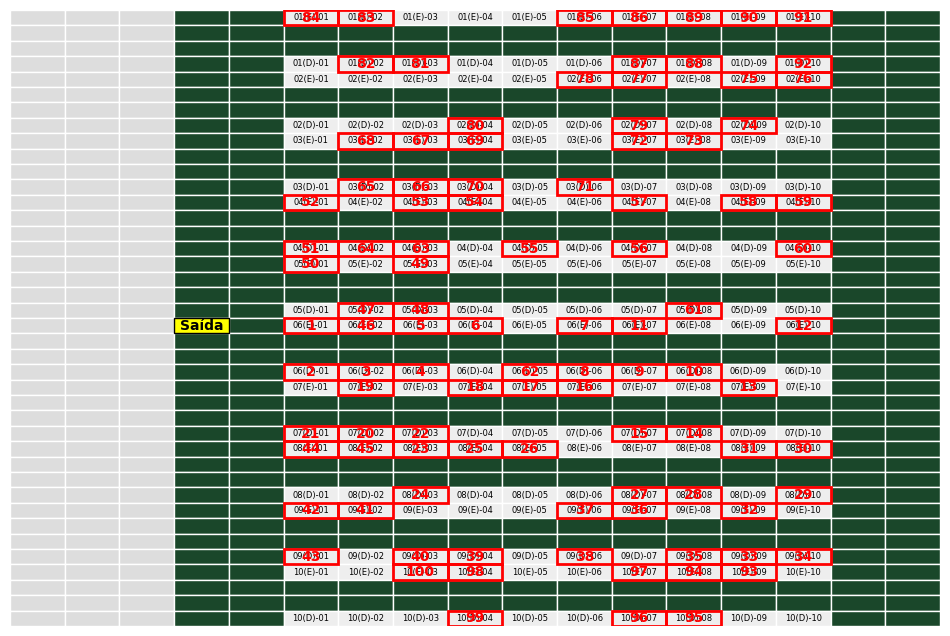

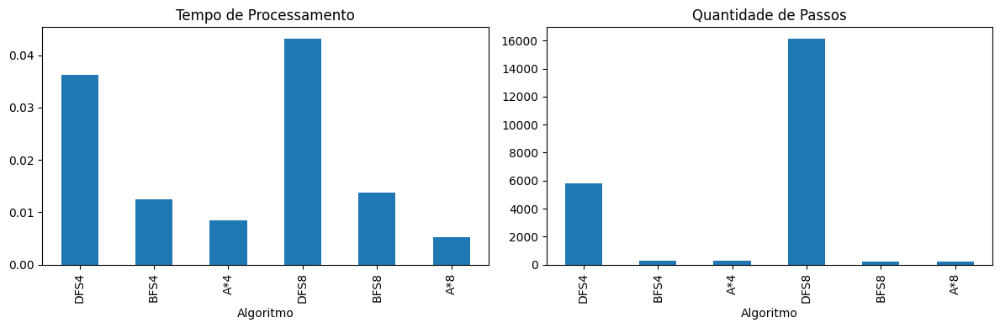

In [86]:
# Instalações necessárias (execute no início da célula)
#!pip install pillow

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import math
import heapq
import time
from itertools import permutations, combinations
from collections import deque, defaultdict
from matplotlib.patches import Rectangle
from matplotlib import animation
from IPython.display import HTML, display

# --------- Configuração do Galpão: 10 ruas ---------
random.seed(42)
num_streets = 10
corridor_height = 2
spacing_height = 2
avenue_width = 2
lockers_per_side = 10
offset = 1
separation_width = 3

# Dimensões do grid
orig_h = (num_streets + 1) * spacing_height + num_streets * corridor_height
width = separation_width + avenue_width*2 + lockers_per_side
height = orig_h - 2*offset
sa = separation_width

# Monta grid de circulação (1 = rua/avenida)
grid = np.zeros((orig_h, width), dtype=int)
grid[:, sa:sa+avenue_width] = 1
grid[:, width-avenue_width:width] = 1
for i in range(num_streets):
    r0 = spacing_height + i*(corridor_height+spacing_height)
    grid[r0:r0+corridor_height, sa:width-avenue_width] = 1
gv = grid[offset:-offset, :]

# --------- Geração de endereços de armários ---------
addresses = {}
for i in range(num_streets):
    vs = spacing_height + i*(corridor_height+spacing_height) - offset
    for j in range(lockers_per_side):
        c = sa + avenue_width + j
        addresses[(vs-1, c)] = f"{i+1:02d}(E)-{j+1:02d}"
        addresses[(vs+corridor_height, c)] = f"{i+1:02d}(D)-{j+1:02d}"

# --------- Interatividade: quantidade de produtos e algoritmo ---------
num_products = int(input("Quantos produtos deseja coletar? (1-100): "))
print("Selecione o algoritmo:")
print("1: DFS 4-direções")
print("2: BFS 4-direções")
print("3: A* 4-direções")
print("4: DFS 8-direções")
print("5: BFS 8-direções")
print("6: A* 8-direções (Manhattan)")
print("7: Comparativo")
choice = input("\nDigite o número do algoritmo (1-7): ")

# --------- Definição das funções de busca ---------
def dfs4(grid, start, goal):
    rows, cols = grid.shape
    visited = set()
    prev = {}
    path = []
    def dfs(u):
        if u == goal:
            path.append(u); return True
        visited.add(u)
        r,c = u
        for dr,dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            v=(r+dr,c+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and v not in visited and grid[v]==1:
                prev[v]=u
                if dfs(v):
                    path.append(u); return True
        return False
    dfs(start)
    return path[::-1]

def bfs4(grid, start, goal):
    rows, cols = grid.shape
    visited = np.zeros_like(grid,bool)
    prev={}
    q=deque([start]); visited[start]=True
    while q:
        r,c=q.popleft()
        if (r,c)==goal:
            p=[]
            while (r,c)!=start:
                p.append((r,c)); r,c=prev[(r,c)]
            p.append(start); return p[::-1]
        for dr,dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            nr,nc=r+dr,c+dc
            if 0<=nr<rows and 0<=nc<cols and not visited[nr,nc] and grid[nr,nc]==1:
                visited[nr,nc]=True; prev[(nr,nc)]=(r,c); q.append((nr,nc))
    return []

def astar4(grid, start, goal):
    rows, cols = grid.shape
    moves=[(1,0),(-1,0),(0,1),(0,-1)]
    open_set=[(abs(start[0]-goal[0])+abs(start[1]-goal[1]), 0, start)]
    came_from={}; gscore=defaultdict(lambda:math.inf); gscore[start]=0
    while open_set:
        f,g,current=heapq.heappop(open_set)
        if current==goal:
            path=[]
            while current!=start:
                path.append(current); current=came_from[current]
            path.append(start); return path[::-1]
        for dr,dc in moves:
            nr,nc=current[0]+dr,current[1]+dc
            if 0<=nr<rows and 0<=nc<cols and grid[nr,nc]==1:
                tg=g+1
                if tg<gscore[(nr,nc)]:
                    came_from[(nr,nc)]=current; gscore[(nr,nc)]=tg
                    h=abs(nr-goal[0])+abs(nc-goal[1])
                    heapq.heappush(open_set,(tg+h,tg,(nr,nc)))
    return []

def dfs8(grid, start, goal):
    rows, cols = grid.shape
    visited=set(); prev={}; path=[]
    moves=[(dr,dc) for dr in(-1,0,1) for dc in(-1,0,1) if (dr,dc)!=(0,0)]
    def dfs(u):
        if u==goal:
            path.append(u); return True
        visited.add(u)
        r,c=u
        for dr,dc in moves:
            v=(r+dr,c+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and v not in visited and grid[v]==1:
                prev[v]=u
                if dfs(v):
                    path.append(u); return True
        return False
    dfs(start); return path[::-1]

def bfs8(grid, start, goal):
    rows,cols=grid.shape; visited=np.zeros_like(grid,bool); prev={}; q=deque([start]); visited[start]=True
    moves=[(dr,dc) for dr in(-1,0,1) for dc in(-1,0,1) if (dr,dc)!=(0,0)]
    while q:
        r,c=q.popleft()
        if (r,c)==goal:
            p=[]
            while (r,c)!=start:
                p.append((r,c)); r,c=prev[(r,c)]
            p.append(start); return p[::-1]
        for dr,dc in moves:
            nr,nc=r+dr,c+dc
            if 0<=nr<rows and 0<=nc<cols and not visited[nr,nc] and grid[nr,nc]==1:
                visited[nr,nc]=True; prev[(nr,nc)]=(r,c); q.append((nr,nc))
    return []

def astar8(grid, start, goal):
    rows,cols=grid.shape
    moves=[(1,0),(-1,0),(0,1),(0,-1),(1,1),(1,-1),(-1,1),(-1,-1)]
    open_set=[(abs(start[0]-goal[0])+abs(start[1]-goal[1]),0,start)]
    came_from={}; gscore=defaultdict(lambda:math.inf); gscore[start]=0
    while open_set:
        f,g,current=heapq.heappop(open_set)
        if current==goal:
            path=[]
            while current!=start:
                path.append(current); current=came_from[current]
            path.append(start); return path[::-1]
        for dr,dc in moves:
            nr,nc=current[0]+dr,current[1]+dc
            if 0<=nr<rows and 0<=nc<cols and grid[nr,nc]==1:
                tg=g+1
                if tg<gscore[(nr,nc)]:
                    came_from[(nr,nc)]=current; gscore[(nr,nc)]=tg
                    h=abs(nr-goal[0])+abs(nc-goal[1])
                    heapq.heappush(open_set,(tg+h,tg,(nr,nc)))
    return []

alg_map = {
    '1': dfs4, '2': bfs4, '3': astar4,
    '4': dfs8, '5': bfs8, '6': astar8
}
alg_name = {
    '1': "DFS 4-dir", '2': "BFS 4-dir", '3': "A* 4-dir",
    '4': "DFS 8-dir", '5': "BFS 8-dir", '6': "A* 8-dir"
}
search_func = alg_map.get(choice, bfs4)
print(f"\nUsando algoritmo: {alg_name.get(choice, 'BFS 4-dir')}")

# --------- Geração do pedido ---------
positions = list(addresses.keys()); random.shuffle(positions)
selected = positions[:num_products]

produtos = [f"Produto {chr(65+i)}" for i in range(num_products)]
display(pd.DataFrame({"Produto": produtos, "Endereço": [addresses[p] for p in selected]}))

# --------- Rota com numeração de ordem ---------
exit_pt = (height//2, sa)
current = exit_pt
to_visit = selected.copy()
full_path = [current]
order_idx = {}; step=1

while to_visit:
    # pontos de acesso
    neighbors=[]
    for r,c in to_visit:
        neighbors.append((r+1,c) if (r+1<height and gv[r+1,c]==1) else (r-1,c))
    # mais próximo
    dists=[abs(current[0]-nr)+abs(current[1]-nc) for nr,nc in neighbors]
    idx=int(np.argmin(dists)); access=neighbors[idx]
    order_idx[access]=step; step+=1
    to_visit.pop(idx)
    seg=search_func(gv, current, access)
    full_path.extend(seg[1:]); current=access

# extensão até coluna 4
while current[1]>3:
    current=(current[0],current[1]-1); full_path.append(current)
arrival_pt=current

# --------- Animação ---------
fig, ax = plt.subplots(figsize=(12,8))
ax.set_xlim(0,width); ax.set_ylim(height,0); ax.axis('off')

# Desenha grid e endereços
for r in range(height):
    for c in range(width):
        face='#DDDDDD' if c<separation_width else ('#1A472A' if gv[r,c]==1 else '#EEEEEE')
        ax.add_patch(Rectangle((c,r),1,1,facecolor=face,edgecolor='white'))
for (r,c),lbl in addresses.items():
    ax.text(c+0.5,r+0.5,lbl,ha='center',va='center',fontsize=6)

# Saída e armários com ordem
ax.add_patch(Rectangle((exit_pt[1],exit_pt[0]),1,1,facecolor='yellow',edgecolor='black'))
ax.text(exit_pt[1]+0.5,exit_pt[0]+0.5,'Saída',ha='center',va='center',fontweight='bold')
for r,c in selected:
    access=(r+1,c) if (r+1<height and gv[r+1,c]==1) else (r-1,c)
    idx=order_idx[access]
    ax.add_patch(Rectangle((c,r),1,1,facecolor='none',edgecolor='red',linewidth=2))
    ax.text(c+0.5,r+0.5,str(idx),ha='center',va='center',color='red',fontweight='bold')

# Patches animados
patches, texts=[],[]; arrows={(0,1):'→',(0,-1):'←',(1,0):'↓',(-1,0):'↑',(1,1):'↘',(1,-1):'↙',(-1,1):'↗',(-1,-1):'↖'}
for _ in full_path:
    p=Rectangle((0,0),1,1,facecolor='blue',edgecolor='white',visible=False); ax.add_patch(p); patches.append(p)
    t=ax.text(0,0,'',ha='center',va='center',color='white',fontsize=12,visible=False); texts.append(t)
arrival_patch=Rectangle((arrival_pt[1],arrival_pt[0]),1,1,facecolor='#90EE90',edgecolor='black',visible=False); ax.add_patch(arrival_patch)
arrival_text=ax.text(arrival_pt[1]+0.5,arrival_pt[0]+0.5,'Chegada',ha='center',va='center',fontweight='bold',fontsize=8,visible=False)

def run_compare(sel):
    results = []
    for name, func in search_funcs.items():
        t0 = time.perf_counter()
        path = compute_full_path(func, sel)
        dt = time.perf_counter() - t0
        results.append({
            "Algoritmo": name,
            "Tempo (s)": dt,
            "Passos": len(path)-1
        })
    df = pd.DataFrame(results)
    display(df)
    fig, axes = plt.subplots(1,2,figsize=(12,4))
    df.plot.bar(x="Algoritmo", y="Tempo (s)", ax=axes[0], legend=False)
    axes[0].set_title("Tempo de Processamento")
    df.plot.bar(x="Algoritmo", y="Passos", ax=axes[1], legend=False)
    axes[1].set_title("Quantidade de Passos")
    plt.tight_layout()
    plt.show()

def run_animation(func, sel):
    # 1) Calcula a rota
    path = compute_full_path(func, sel)
    exit_pt = (height//2, sa)
    arrival_pt = path[-1]

    # 2) Cria figura e eixos
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.set_xlim(0, width)
    ax.set_ylim(height, 0)
    ax.axis('off')

    # 3) Desenha o grid estático
    for r in range(height):
        for c in range(width):
            face = '#DDDDDD' if c < separation_width else (
                   '#1A472A' if gv[r, c] == 1 else '#EEEEEE')
            ax.add_patch(Rectangle((c, r), 1, 1, facecolor=face, edgecolor='white'))

    # 4) Desenha os endereços dos armários
    for (r, c), label in addresses.items():
        ax.text(c+0.5, r+0.5, label,
                va='center', ha='center', fontsize=6)

    # 5) Destaca a saída
    ax.add_patch(Rectangle((exit_pt[1], exit_pt[0]), 1, 1,
                           facecolor='yellow', edgecolor='black'))
    ax.text(exit_pt[1]+0.5, exit_pt[0]+0.5, 'Saída',
            va='center', ha='center', fontweight='bold')

    # 6) Destaca os armários do pedido, numerando na ordem em sel
    for idx, (r, c) in enumerate(sel, start=1):
        ax.add_patch(Rectangle((c, r), 1, 1,
                               facecolor='none', edgecolor='red', linewidth=2))
        ax.text(c+0.5, r+0.5, str(idx),
                va='center', ha='center', color='red', fontweight='bold')

    # 7) Prepara os patches animados e as setas de direção
    patches, texts = [], []
    arrow_map = {
        (0,1):  '→', (0,-1): '←', (1,0): '↓', (-1,0): '↑',
        (1,1):  '↘', (1,-1): '↙', (-1,1): '↗', (-1,-1): '↖'
    }
    for _ in path:
        p = Rectangle((0,0), 1, 1, facecolor='blue',
                      edgecolor='white', visible=False)
        ax.add_patch(p)
        patches.append(p)
        t = ax.text(0, 0, '', ha='center', va='center',
                    color='white', fontsize=12, visible=False)
        texts.append(t)

    # Rótulos das avenidas
    ax.text(sa+avenue_width/2, -1, "Rua - Frente", ha='center', fontsize=12, color='brown', fontweight='bold')
    ax.text(width-avenue_width/2, -1, "Rua - Fundo", ha='center', fontsize=12, color='brown', fontweight='bold')

    # Rótulos das ruas
    for i in range(num_streets):
        y_pos = spacing_height + i*(corridor_height+spacing_height) + corridor_height/2 - offset
        ax.text(-0.5, y_pos, f"Rua {i+1:02d}", ha='right', va='center', fontsize=10, fontweight='bold')

    # 8) Ponto de chegada
    arrival_patch = Rectangle((arrival_pt[1], arrival_pt[0]), 1, 1,
                              facecolor='#90EE90', edgecolor='black', visible=False)
    arrival_text = ax.text(arrival_pt[1]+0.5, arrival_pt[0]+0.5,
                           'Chegada', ha='center', va='center',
                           fontweight='bold', fontsize=8, visible=False)
    ax.add_patch(arrival_patch)

    # 9) Função de inicialização da animação
    def init():
        for p, t in zip(patches, texts):
            p.set_visible(False)
            t.set_visible(False)
        arrival_patch.set_visible(False)
        arrival_text.set_visible(False)
        return patches + texts + [arrival_patch, arrival_text]

    # 10) Função de frame a frame
    def animate(i):
        r, c = path[i]
        patches[i].set_xy((c, r))
        patches[i].set_visible(True)

        if i < len(path)-1:
            nr, nc = path[i+1]
            dr, dc = nr-r, nc-c
            arrow = arrow_map.get((dr, dc), '')
            texts[i].set_position((c+0.5, r+0.5))
            texts[i].set_text(arrow)
            texts[i].set_visible(True)
        else:
            arrival_patch.set_visible(True)
            arrival_text.set_visible(True)

        return patches[i], texts[i], arrival_patch, arrival_text

    # 11) Gera e exibe a animação
    anim = animation.FuncAnimation(
        fig, animate, init_func=init,
        frames=len(path), interval=300, blit=True
    )
    plt.close(fig)
    display(HTML(anim.to_jshtml()))

def run_stats_and_animation(func, sel, alg_name):
    # 1.1) estatísticas
    t0 = time.perf_counter()
    path = compute_full_path(func, sel)
    dt = time.perf_counter() - t0
    steps = len(path) - 1

    # 1.2) exibe DataFrame de uma linha
    import pandas as pd
    df = pd.DataFrame([{
        'Algoritmo': alg_name,
        'Tempo (s)': dt,
        'Passos': steps
    }])
    display(df)

    # 1.3) animação
    run_animation(func, sel)

# 2) Construa o mapa de handlers usando esse helper
num_to_alg = {
    '1': ('DFS 4-dir', dfs4),
    '2': ('BFS 4-dir', bfs4),
    '3': ('A* 4-dir', astar4),
    '4': ('DFS 8-dir', dfs8),
    '5': ('BFS 8-dir', bfs8),
    '6': ('A* 8-dir', astar8),
    '7': ('Compare', None)
}

handlers = {}
for key, (name, func) in num_to_alg.items():
    if key == '7':
        handlers[key] = lambda sel: run_compare(sel)
    else:
        handlers[key] = (lambda f, nm: lambda sel: run_stats_and_animation(f, sel, nm))(
            func, name
        )

# 3) Executa
sel = random.sample(positions, num_products)
handler = handlers.get(choice)
if handler is None:
    raise ValueError(f"Opção inválida: {choice}")
handler(sel)


,Algoritmo,Tempo (s),Passos
0,DFS4,0.004886,383
1,BFS4,0.002050,71
2,A*4,0.001107,71
3,DFS8,0.005564,405
4,BFS8,0.003143,61
5,A*8,0.008582,61


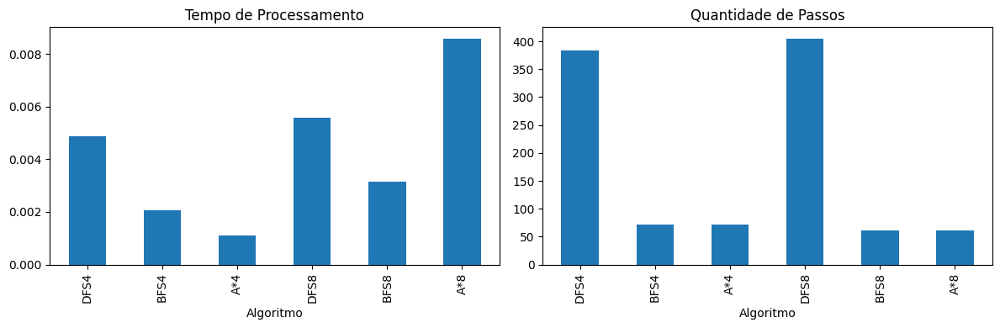

In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import time
import math
import heapq
from collections import deque, defaultdict
from itertools import permutations, combinations

# --------- Configurações ---------
random.seed(42)
num_streets = 10
corridor_height = 2
spacing_height = 2
avenue_width = 2
lockers_per_side = 10
offset = 1
separation_width = 3

orig_h = (num_streets + 1)*spacing_height + num_streets*corridor_height
width = separation_width + avenue_width*2 + lockers_per_side
height = orig_h - 2*offset
sa = separation_width

# Monta grid 1=circulação
grid = np.zeros((orig_h, width), int)
grid[:, sa:sa+avenue_width] = 1
grid[:, width-avenue_width:width] = 1
for i in range(num_streets):
    r0 = spacing_height + i*(corridor_height+spacing_height)
    grid[r0:r0+corridor_height, sa:width-avenue_width] = 1
gv = grid[offset:-offset, :]

# Lista de posições de armários
positions = []
for i in range(num_streets):
    vs = spacing_height + i*(corridor_height+spacing_height) - offset
    for j in range(lockers_per_side):
        c = sa + avenue_width + j
        positions.extend([(vs-1, c), (vs+corridor_height, c)])

# --------- Função auxiliar para rota (nearest neighbor) ---------
def compute_full_path(func, sel):
    exit_pt = (height//2, sa)
    current = exit_pt
    to_visit = sel.copy()
    full_path = [current]
    while to_visit:
        neighbors = []
        for r,c in to_visit:
            neighbors.append((r+1,c) if r+1<height and gv[r+1,c]==1 else (r-1,c))
        dists = [abs(current[0]-nr)+abs(current[1]-nc) for nr,nc in neighbors]
        idx = int(np.argmin(dists))
        access = neighbors[idx]
        to_visit.pop(idx)
        seg = func(gv, current, access)
        full_path.extend(seg[1:])
        current = access
    # extensão até coluna 4
    while current[1] > 3:
        current = (current[0], current[1]-1)
        full_path.append(current)
    return full_path

# --------- Algoritmos de busca ---------
def dfs4(g, s, t):
    rows,cols=g.shape; visited=set(); prev={}; path=[]
    moves=[(-1,0),(1,0),(0,-1),(0,1)]
    def dfs(u):
        if u==t:
            path.append(u); return True
        visited.add(u)
        for dr,dc in moves:
            v=(u[0]+dr,u[1]+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and v not in visited and g[v]==1:
                prev[v]=u
                if dfs(v):
                    path.append(u); return True
        return False
    dfs(s); return path[::-1]

def bfs4(g, s, t):
    rows,cols=g.shape; visited=np.zeros_like(g,bool); prev={}; q=deque([s]); visited[s]=True
    moves=[(-1,0),(1,0),(0,-1),(0,1)]
    while q:
        u=q.popleft()
        if u==t:
            path=[]
            while u!=s:
                path.append(u); u=prev[u]
            path.append(s); return path[::-1]
        for dr,dc in moves:
            v=(u[0]+dr,u[1]+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and not visited[v] and g[v]==1:
                visited[v]=True; prev[v]=u; q.append(v)
    return []

def astar4(g, s, t):
    rows,cols=g.shape; moves=[(-1,0),(1,0),(0,-1),(0,1)]
    open_set=[(abs(s[0]-t[0])+abs(s[1]-t[1]),0,s)]
    came_from={}; gscore=defaultdict(lambda:math.inf); gscore[s]=0
    while open_set:
        _,g_cur,u=heapq.heappop(open_set)
        if u==t:
            path=[]
            while u!=s:
                path.append(u); u=came_from[u]
            path.append(s); return path[::-1]
        for dr,dc in moves:
            v=(u[0]+dr,u[1]+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and g[v]==1:
                tg=g_cur+1
                if tg<gscore[v]:
                    gscore[v]=tg; came_from[v]=u
                    h=abs(v[0]-t[0])+abs(v[1]-t[1])
                    heapq.heappush(open_set,(tg+h,tg,v))
    return []

def dfs8(g, s, t):
    rows,cols=g.shape; visited=set(); prev={}; path=[]
    moves=[(dr,dc) for dr in(-1,0,1) for dc in(-1,0,1) if (dr,dc)!=(0,0)]
    def dfs(u):
        if u==t:
            path.append(u); return True
        visited.add(u)
        for dr,dc in moves:
            v=(u[0]+dr,u[1]+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and v not in visited and g[v]==1:
                prev[v]=u
                if dfs(v):
                    path.append(u); return True
        return False
    dfs(s); return path[::-1]

def bfs8(g, s, t):
    rows,cols=g.shape; visited=np.zeros_like(g,bool); prev={}; q=deque([s]); visited[s]=True
    moves=[(dr,dc) for dr in(-1,0,1) for dc in(-1,0,1) if (dr,dc)!=(0,0)]
    while q:
        u=q.popleft()
        if u==t:
            path=[]
            while u!=s:
                path.append(u); u=prev[u]
            path.append(s); return path[::-1]
        for dr,dc in moves:
            v=(u[0]+dr,u[1]+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and not visited[v] and g[v]==1:
                visited[v]=True; prev[v]=u; q.append(v)
    return []

def astar8(g, s, t):
    rows,cols=g.shape; visited=set()
    moves=[(dr,dc) for dr in(-1,0,1) for dc in(-1,0,1) if (dr,dc)!=(0,0)]
    open_set=[(abs(s[0]-t[0])+abs(s[1]-t[1]),0,s)]
    came_from={}; gscore=defaultdict(lambda:math.inf); gscore[s]=0
    while open_set:
        _,g_cur,u=heapq.heappop(open_set)
        if u==t:
            path=[]
            while u!=s:
                path.append(u); u=came_from[u]
            path.append(s); return path[::-1]
        for dr,dc in moves:
            v=(u[0]+dr,u[1]+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and g[v]==1:
                tg=g_cur+1
                if tg<gscore[v]:
                    gscore[v]=tg; came_from[v]=u
                    h=abs(v[0]-t[0])+abs(v[1]-t[1])
                    heapq.heappush(open_set,(tg+h,tg,v))
    return []

search_funcs = {
    'DFS4': dfs4, 'BFS4': bfs4, 'A*4': astar4,
    'DFS8': dfs8, 'BFS8': bfs8, 'A*8': astar8
}

# --------- Executa comparativo ---------
num_products = 3  # ajuste conforme desejar
selected = random.sample(positions, num_products)

results = []
for name, func in search_funcs.items():
    start = time.perf_counter()
    path = compute_full_path(func, selected)
    duration = time.perf_counter() - start
    results.append({
        'Algoritmo': name,
        'Tempo (s)': duration,
        'Passos': len(path)-1
    })

df = pd.DataFrame(results)
display(df)

# Gráficos comparativos
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
df.plot.bar(x='Algoritmo', y='Tempo (s)', ax=axes[0], legend=False)
axes[0].set_title('Tempo de Processamento')
df.plot.bar(x='Algoritmo', y='Passos', ax=axes[1], legend=False)
axes[1].set_title('Quantidade de Passos')
plt.tight_layout()
plt.show()


<ipython-input-18-a54f8ead0939>:153: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  summary = df.groupby('strategy').describe().stack(level=0)


count       mean        std  min        25%  \
strategy                                                                
astar     manhattan_sum   100.0  45.210000  18.746741  8.0  32.750000   
          n_products      100.0   3.030000   1.366667  1.0   2.000000   
          overhead_ratio  100.0   1.173739   0.140927  1.0   1.067853   
          total_steps     100.0  53.590000  23.620354  8.0  35.000000   
          turns           100.0   8.970000   4.708589  2.0   5.000000   
heuristic manhattan_sum   100.0  45.210000  18.746741  8.0  32.750000   
          n_products      100.0   3.030000   1.366667  1.0   2.000000   
          overhead_ratio  100.0   1.173739   0.140927  1.0   1.067853   
          total_steps     100.0  53.590000  23.620354  8.0  35.000000   
          turns           100.0   7.490000   4.071321  2.0   5.000000   

                                50%        75%         max  
strategy                                                    
astar     manhattan_sum   40.000000  60.250000   93.000000  
          n_products       3.000000   4.000000    5.000000  
          overhead_ratio   1.151923   1.251603    1.666667  
          total_steps     48.500000  71.500000  109.000000  
          turns            8.000000  13.000000   18.000000  
heuristic manhattan_sum   40.000000  60.250000   93.000000  
          n_products       3.000000   4.000000    5.000000  
          overhead_ratio   1.151923   1.251603    1.666667  
          total_steps     48.500000  71.500000  109.000000  
          turns            6.500000  11.000000   16.000000

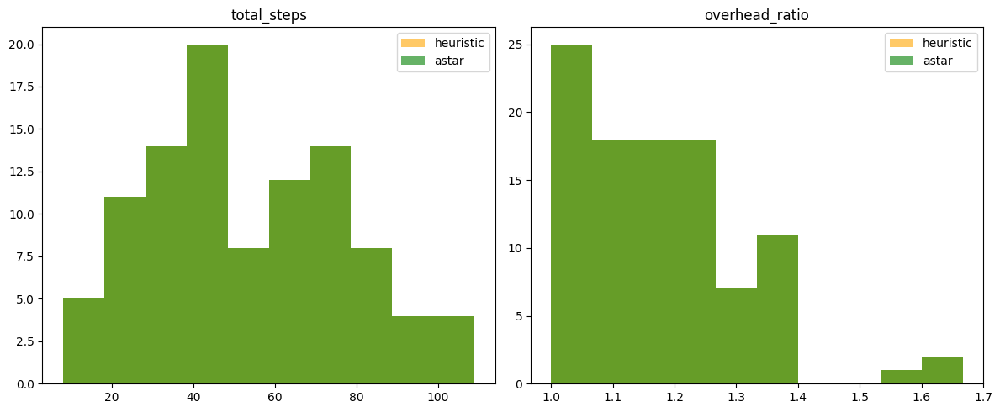

In [18]:
import numpy as np
import pandas as pd
import random
from collections import deque, defaultdict
import heapq
import matplotlib.pyplot as plt

# --------- Setup inicial (grid e funções BFS/A*) ---------
random.seed(42)
num_streets = 10
corridor_height = 2
spacing_height = 2
avenue_width = 2
lockers_per_side = 10
offset = 1
separation_width = 3

# Dimensões do grid
orig_h = (num_streets + 1)*spacing_height + num_streets*corridor_height
width = separation_width + avenue_width*2 + lockers_per_side
height = orig_h - 2*offset

# Monta grid de circulação binário (1=rua/avenida)
grid = np.zeros((orig_h, width), int)
sa = separation_width
grid[:, sa:sa+avenue_width] = 1
grid[:, width-avenue_width:width] = 1
for i in range(num_streets):
    r0 = spacing_height + i*(corridor_height+spacing_height)
    grid[r0:r0+corridor_height, sa:width-avenue_width] = 1
gv = grid[offset:-offset, :]

# Lista de armários
positions = []
for i in range(num_streets):
    vs = spacing_height + i*(corridor_height+spacing_height) - offset
    for j in range(lockers_per_side):
        c = sa + avenue_width + j
        positions.append((vs-1, c))
        positions.append((vs+corridor_height, c))

# Célula de saída
exit_pt = (height//2, sa)

# Busca BFS (como antes)
def bfs_path(grid, start, goal):
    rows, cols = grid.shape
    visited = np.zeros_like(grid, bool)
    prev = {}
    q = deque([start]); visited[start] = True
    while q:
        r,c = q.popleft()
        if (r,c)==goal:
            path = []
            while (r,c)!=start:
                path.append((r,c))
                r,c = prev[(r,c)]
            path.append(start)
            return path[::-1]
        for dr,dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            nr, nc = r+dr, c+dc
            if 0<=nr<rows and 0<=nc<cols and not visited[nr,nc] and grid[nr,nc]==1:
                visited[nr,nc] = True
                prev[(nr,nc)] = (r,c)
                q.append((nr,nc))
    return []

# Busca A* com heurística Manhattan
def astar_path(grid, start, goal):
    rows, cols = grid.shape
    open_set = [(0 + abs(start[0]-goal[0]) + abs(start[1]-goal[1]), 0, start)]
    came_from = {}
    gscore = defaultdict(lambda: np.inf)
    gscore[start] = 0
    while open_set:
        f, g, current = heapq.heappop(open_set)
        if current == goal:
            path = []
            while current != start:
                path.append(current)
                current = came_from[current]
            path.append(start)
            return path[::-1]
        for dr, dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            nr, nc = current[0]+dr, current[1]+dc
            if 0<=nr<rows and 0<=nc<cols and grid[nr,nc]==1:
                tentative = g + 1
                neigh = (nr,nc)
                if tentative < gscore[neigh]:
                    came_from[neigh] = current
                    gscore[neigh] = tentative
                    fscore = tentative + abs(nr-goal[0]) + abs(nc-goal[1])
                    heapq.heappush(open_set, (fscore, tentative, neigh))
    return []

# Função para rotas e estatísticas de ambas as estratégias
def simulate_run(selected):
    # define celulas de acesso
    accesses = []
    for (r,c) in selected:
        if r+1<height and gv[r+1,c]==1: accesses.append((r+1,c))
        else: accesses.append((r-1,c))
    # algoritmos: 'heuristic' usa nearest+ BFS; 'astar' usa A* sequencial
    results = {}
    for label, finder in [('heuristic', bfs_path), ('astar', astar_path)]:
        # nearest neighbor order
        curr = exit_pt
        to_visit = accesses.copy()
        seq = []
        path = [curr]
        while to_visit:
            dists = [abs(curr[0]-nr)+abs(curr[1]-nc) for nr,nc in to_visit]
            idx = int(np.argmin(dists))
            nxt = to_visit.pop(idx)
            seg = finder(gv, curr, nxt)
            path.extend(seg[1:])
            curr = nxt
            seq.append((nxt, seg))
        # extensão
        while curr[1]>3:
            curr=(curr[0],curr[1]-1); path.append(curr)
        # coleta stats
        total_steps = len(path)-1
        pts = [exit_pt]+[a for a,_ in seq]+[path[-1]]
        manh = sum(abs(pts[i][0]-pts[i+1][0])+abs(pts[i][1]-pts[i+1][1])
                   for i in range(len(pts)-1))
        results[label] = {'total_steps': total_steps,
                          'manhattan_sum': manh,
                          'overhead_ratio': total_steps/manh if manh else np.nan,
                          'turns': sum(1 for i in range(len(path)-2)
                                       if (path[i+1][0]-path[i][0],path[i+1][1]-path[i][1])
                                          !=(path[i+2][0]-path[i+1][0],path[i+2][1]-path[i+1][1]))}
    return results

# ----- Simulação para comparativo -----
runs = []
random.seed(42)
for _ in range(100):
    random.shuffle(positions)
    n = random.randint(1,5)
    selected = positions[:n]
    res = simulate_run(selected)
    # empilha
    for algo in ['heuristic','astar']:
        stats = res[algo]
        stats['strategy'] = algo
        stats['n_products'] = n
        runs.append(stats)

df = pd.DataFrame(runs)

# ----- Apresentação dos resultados -----
summary = df.groupby('strategy').describe().stack(level=0)
display(summary)

# Gráficos comparativos
fig, axes = plt.subplots(1,2, figsize=(12,5))
for idx, metric in enumerate(['total_steps','overhead_ratio']):
    for algo, color in [('heuristic','orange'),('astar','green')]:
        axes[idx].hist(df[df.strategy==algo][metric], bins=10, alpha=0.6, label=algo, color=color)
    axes[idx].set_title(metric)
    axes[idx].legend()
plt.tight_layout()
plt.show()


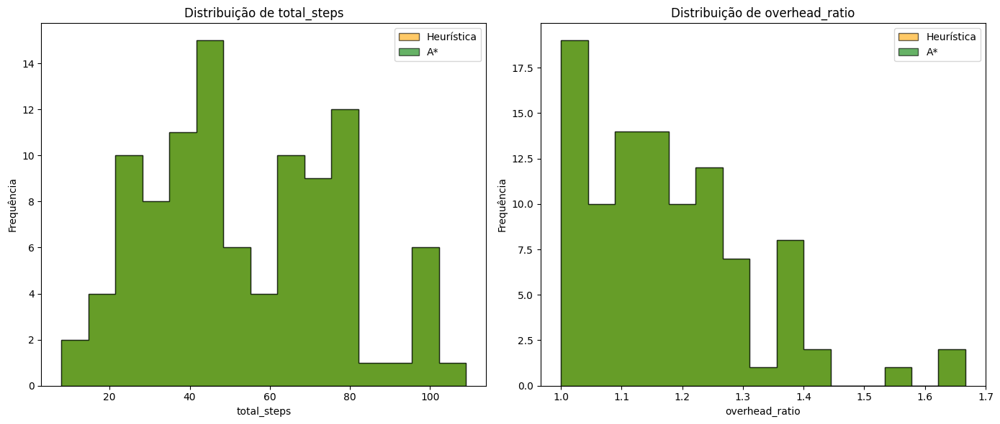

<Figure size 800x600 with 0 Axes>

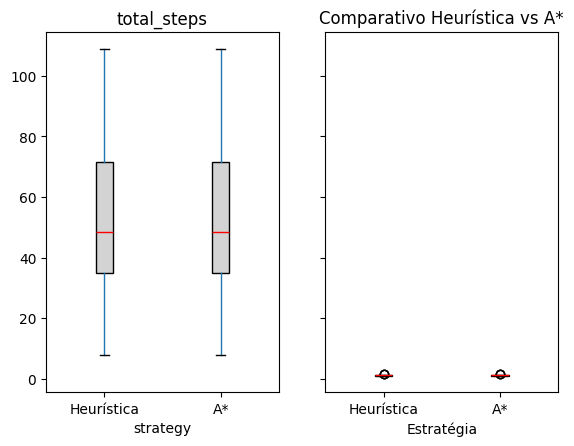

In [19]:
import matplotlib.pyplot as plt
import pandas as pd

# Supondo que df já existe no ambiente e contém as colunas:
# 'strategy', 'total_steps', 'overhead_ratio'

# Gráficos de histograma comparativos (com bins comuns e formatos visuais melhores)
metrics = ['total_steps', 'overhead_ratio']
colors = {'heuristic':'orange', 'astar':'green'}
labels = {'heuristic':'Heurística', 'astar':'A*'}

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, metric in zip(axes, metrics):
    # usa histtype 'stepfilled' para sobrepor com transparência
    for strat in ['heuristic','astar']:
        ax.hist(df[df.strategy==strat][metric],
                bins=15,
                histtype='stepfilled',
                alpha=0.6,
                color=colors[strat],
                label=labels[strat],
                edgecolor='black')
    ax.set_title(f'Distribuição de {metric}')
    ax.set_xlabel(metric)
    ax.set_ylabel('Frequência')
    ax.legend()

plt.tight_layout()
plt.show()

# Boxplot comparativo dos dois métodos
plt.figure(figsize=(8,6))
df.boxplot(column=metrics, by='strategy', grid=False,
           patch_artist=True,
           boxprops=dict(facecolor='lightgray'),
           medianprops=dict(color='red'))
plt.suptitle('')
plt.title('Comparativo Heurística vs A*')
plt.xlabel('Estratégia')
plt.ylabel('Valor')
plt.xticks([1,2], ['Heurística','A*'])
plt.show()


Comparativo:
* DFS: busca em profundidade (4-direções)
* BFS: busca em largura (4-direções)
* UCS: custo uniforme (4-direções)
* Heurística: BFS + vizinho próximo (4-direções)
* A*: A* (4-direções)
* Diagonal: BFS com diagonais (8-direções)

,count,mean,std,min,25%,50%,75%,max
total_steps,600.0,109.248333,150.811007,6.00,36.00000,58.000000,82.000000,774.000000
manhattan_sum,600.0,45.210000,18.668335,8.00,32.75000,40.000000,60.250000,93.000000
overhead_ratio,600.0,2.432829,3.185619,0.75,1.04878,1.163722,1.357143,18.481481
turns,600.0,29.586667,50.937873,2.00,5.00000,10.000000,17.000000,244.000000
n_products,600.0,3.030000,1.360951,1.00,2.00000,3.000000,4.000000,5.000000


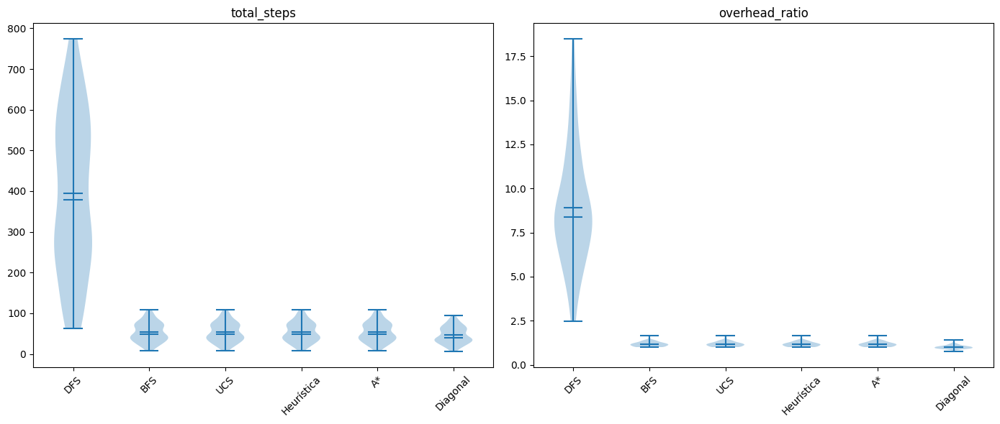

In [23]:
import numpy as np
import pandas as pd
import random
from collections import deque, defaultdict
import heapq
import matplotlib.pyplot as plt
from IPython.display import display

# ------- Configuração do Galpão: 10 ruas -------
random.seed(42)
num_streets = 10
corridor_height = 2
spacing_height = 2
avenue_width = 2
lockers_per_side = 10
offset = 1
separation_width = 3

orig_h = (num_streets + 1) * spacing_height + num_streets * corridor_height
width = separation_width + avenue_width * 2 + lockers_per_side
height = orig_h - 2 * offset
sa = separation_width

# Monta grid de circulação (1 = rua/avenida)
grid = np.zeros((orig_h, width), dtype=int)
grid[:, sa:sa+avenue_width] = 1
grid[:, width-avenue_width:width] = 1
for i in range(num_streets):
    r0 = spacing_height + i * (corridor_height + spacing_height)
    grid[r0:r0+corridor_height, sa:width-avenue_width] = 1
gv = grid[offset:-offset, :]

# Todas posições de armários
positions = []
for i in range(num_streets):
    vs = spacing_height + i * (corridor_height + spacing_height) - offset
    for j in range(lockers_per_side):
        c = sa + avenue_width + j
        positions.append((vs-1, c))
        positions.append((vs+corridor_height, c))

exit_pt = (height//2, sa)

# ------- Funções de busca -------

# BFS 4-direções
def bfs4(grid, start, goal):
    rows, cols = grid.shape
    visited = np.zeros_like(grid, bool)
    prev = {}
    q = deque([start]); visited[start] = True
    while q:
        r,c = q.popleft()
        if (r,c) == goal:
            path=[]
            while (r,c)!=start:
                path.append((r,c))
                r,c = prev[(r,c)]
            path.append(start); return path[::-1]
        for dr,dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            nr,nc = r+dr, c+dc
            if 0<=nr<rows and 0<=nc<cols and not visited[nr,nc] and grid[nr,nc]==1:
                visited[nr,nc] = True
                prev[(nr,nc)] = (r,c)
                q.append((nr,nc))
    return []

# DFS 4-direções
def dfs4(grid, start, goal):
    rows, cols = grid.shape
    visited = set()
    path = []
    def dfs(u):
        if u == goal:
            path.append(u)
            return True
        visited.add(u)
        r,c = u
        for dr,dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            v = (r+dr, c+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and v not in visited and grid[v]==1:
                if dfs(v):
                    path.append(u)
                    return True
        return False
    dfs(start)
    return path[::-1] if path else []

# Uniform-cost search (Dijkstra) 4-direções
def ucs4(grid, start, goal):
    rows, cols = grid.shape
    prev = {}
    cost = defaultdict(lambda: float('inf'))
    cost[start] = 0
    visited = set()
    pq = [(0, start)]
    while pq:
        c,u = heapq.heappop(pq)
        if u in visited: continue
        visited.add(u)
        if u == goal: break
        r,c0 = u
        for dr,dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            v = (r+dr, c0+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and grid[v]==1:
                newc = cost[u] + 1
                if newc < cost[v]:
                    cost[v] = newc
                    prev[v] = u
                    heapq.heappush(pq, (newc, v))
    if goal not in prev and start!=goal:
        return []
    path = [goal]; u = goal
    while u != start:
        u = prev[u]
        path.append(u)
    return path[::-1]

# A* 4-direções (heurística Manhattan)
def astar4(grid, start, goal):
    rows, cols = grid.shape
    open_set = [(0 + abs(start[0]-goal[0]) + abs(start[1]-goal[1]), 0, start)]
    came_from = {}
    gscore = defaultdict(lambda: float('inf'))
    gscore[start] = 0
    while open_set:
        f,g,current = heapq.heappop(open_set)
        if current == goal:
            path=[]
            while current != start:
                path.append(current)
                current = came_from[current]
            path.append(start)
            return path[::-1]
        r,c = current
        for dr,dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            v = (r+dr, c+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and grid[v]==1:
                tg = g + 1
                if tg < gscore[v]:
                    came_from[v] = current
                    gscore[v] = tg
                    heapq.heappush(open_set, (tg + abs(v[0]-goal[0]) + abs(v[1]-goal[1]), tg, v))
    return []

# BFS 8-direções (diagonal)
def bfs8(grid, start, goal):
    rows, cols = grid.shape
    visited = np.zeros_like(grid, bool)
    prev = {}
    q = deque([start]); visited[start] = True
    moves = [(dr,dc) for dr in (-1,0,1) for dc in (-1,0,1) if (dr,dc)!=(0,0)]
    while q:
        r,c = q.popleft()
        if (r,c)==goal:
            path=[]
            while (r,c)!=start:
                path.append((r,c))
                r,c = prev[(r,c)]
            path.append(start); return path[::-1]
        for dr,dc in moves:
            v=(r+dr, c+dc)
            if 0<=v[0]<rows and 0<=v[1]<cols and not visited[v] and grid[v]==1:
                visited[v] = True
                prev[v] = (r,c)
                q.append(v)
    return []

# ------- Simulação e estatísticas -------
def simulate(selected, finder):
    # acessos adjacentes
    accesses = []
    for r,c in selected:
        if r+1<height and gv[r+1,c]==1: accesses.append((r+1,c))
        else: accesses.append((r-1,c))
    curr=exit_pt; path=[curr]; seq=[]
    to_visit=accesses.copy()
    while to_visit:
        dists=[abs(curr[0]-nr)+abs(curr[1]-nc) for nr,nc in to_visit]
        idx=int(np.argmin(dists))
        nxt=to_visit.pop(idx)
        seg=finder(gv, curr, nxt)
        path.extend(seg[1:]); seq.append((nxt,seg)); curr=nxt
    while curr[1]>3:
        curr=(curr[0],curr[1]-1); path.append(curr)
    return path, seq

def stats(path, seq):
    total=len(path)-1
    pts=[exit_pt]+[s[0] for s in seq]+[path[-1]]
    manh=sum(abs(pts[i][0]-pts[i+1][0])+abs(pts[i][1]-pts[i+1][1]) for i in range(len(pts)-1))
    dirs=[(path[i+1][0]-path[i][0], path[i+1][1]-path[i][1]) for i in range(len(path)-1)]
    turns=sum(1 for i in range(len(dirs)-1) if dirs[i]!=dirs[i+1])
    return {'total_steps': total, 'manhattan_sum': manh, 'overhead_ratio': total/manh if manh else np.nan, 'turns': turns}

strategies = [
    ('DFS', dfs4),
    ('BFS', bfs4),
    ('UCS', ucs4),
    ('Heurística', bfs4),
    ('A*', astar4),
    ('Diagonal', bfs8)
]

runs=[]
random.seed(42)
for _ in range(100):
    random.shuffle(positions)
    n=random.randint(1,5)
    sel=positions[:n]
    for label, finder in strategies:
        path, seq = simulate(sel, finder)
        s=stats(path, seq)
        s.update({'strategy': label, 'n_products': n})
        runs.append(s)

df = pd.DataFrame(runs)

# Exibe resumo
display(df.describe().T)

# Violin plots
fig, axes = plt.subplots(1,2,figsize=(14,6))
metrics = ['total_steps','overhead_ratio']
for ax, metric in zip(axes, metrics):
    data=[df[df.strategy==label][metric] for label,_ in strategies]
    ax.violinplot(data, positions=range(1,len(strategies)+1),
                  showmeans=True, showmedians=True)
    ax.set_xticks(range(1,len(strategies)+1))
    ax.set_xticklabels([label for label,_ in strategies], rotation=45)
    ax.set_title(metric)
plt.tight_layout()
plt.show()


In [14]:
import numpy as np
import pandas as pd
import random
from collections import deque

# Parâmetros do galpão
num_streets = 10
corridor_height = 2
spacing_height = 2
avenue_width = 2
lockers_per_side = 10
offset = 1
separation_width = 3

# Dimensões
orig_h = (num_streets + 1) * spacing_height + num_streets * corridor_height
width = separation_width + avenue_width*2 + lockers_per_side
height = orig_h - 2*offset

# Geração de grid de circulação (1 = rua/avenida)
grid = np.zeros((orig_h, width), dtype=int)
sa = separation_width
grid[:, sa:sa+avenue_width] = 1
grid[:, width-avenue_width:width] = 1
for i in range(num_streets):
    r0 = spacing_height + i*(corridor_height+spacing_height)
    grid[r0:r0+corridor_height, sa:width-avenue_width] = 1
gv = grid[offset:-offset, :]

# Lista de posições de armários
positions = []
for i in range(num_streets):
    vs = spacing_height + i*(corridor_height+spacing_height) - offset
    for j in range(lockers_per_side):
        c = sa + avenue_width + j
        positions.append((vs-1, c))
        positions.append((vs+corridor_height, c))

# BFS para trajetos válidos
def bfs_path(grid, start, goal):
    rows, cols = grid.shape
    visited = np.zeros_like(grid, bool)
    prev = {}
    q = deque([start])
    visited[start] = True
    while q:
        r, c = q.popleft()
        if (r, c) == goal:
            path = []
            while (r, c) != start:
                path.append((r, c))
                r, c = prev[(r, c)]
            path.append(start)
            return path[::-1]
        for dr, dc in [(-1,0),(1,0),(0,-1),(0,1)]:
            nr, nc = r+dr, c+dc
            if 0 <= nr < rows and 0 <= nc < cols and not visited[nr,nc] and grid[nr,nc] == 1:
                visited[nr,nc] = True
                prev[(nr,nc)] = (r, c)
                q.append((nr, nc))
    return []

# Função que calcula rota e dados de acesso
def compute_route(selected):
    exit_pt = (height//2, sa)
    current = exit_pt
    to_visit = selected.copy()
    full_path = [current]
    access_sequence = []
    # coleta
    while to_visit:
        neighbors = []
        for (r, c) in to_visit:
            if r+1 < height and gv[r+1, c] == 1:
                access = (r+1, c)
            else:
                access = (r-1, c)
            neighbors.append(access)
        dists = [abs(current[0]-nr) + abs(current[1]-nc) for nr, nc in neighbors]
        idx = int(np.argmin(dists))
        access = neighbors[idx]
        locker = to_visit.pop(idx)
        seg = bfs_path(gv, current, access)
        full_path.extend(seg[1:])
        access_sequence.append((locker, access, seg))
        current = access
    # extensão até coluna 4
    arrival_col = 3
    while current[1] > arrival_col:
        current = (current[0], current[1]-1)
        full_path.append(current)
    return full_path, access_sequence

# Estatísticas da rota
def compute_stats(full_path, access_sequence):
    total_steps = len(full_path) - 1
    # soma Manhattan ideal: saída -> acessos -> chegada
    pts = [full_path[0]] + [seq[1] for seq in access_sequence] + [full_path[-1]]
    manhattan = sum(abs(pts[i][0]-pts[i+1][0]) + abs(pts[i][1]-pts[i+1][1]) for i in range(len(pts)-1))
    # curvas
    dirs = [(full_path[i+1][0]-full_path[i][0], full_path[i+1][1]-full_path[i][1]) for i in range(len(full_path)-1)]
    turns = sum(1 for i in range(len(dirs)-1) if dirs[i+1] != dirs[i])
    # segmentos de coleta
    seg_lengths = [len(seg)-1 for (_, _, seg) in access_sequence]
    return {
        'total_steps': total_steps,
        'manhattan_sum': manhattan,
        'overhead_ratio': total_steps/manhattan if manhattan else None,
        'turns': turns,
        'avg_segment_length': sum(seg_lengths)/len(seg_lengths) if seg_lengths else 0
    }

# Simulação de 100 pedidos
random.seed(42)
runs = []
for _ in range(100):
    random.shuffle(positions)
    n = random.randint(1, 5)
    selected = positions[:n]
    full_path, access_seq = compute_route(selected)
    stats = compute_stats(full_path, access_seq)
    stats['n_products'] = n
    runs.append(stats)

# Resumo estatístico
df = pd.DataFrame(runs)
display(df.describe().T)


,count,mean,std,min,25%,50%,75%,max
total_steps,100.0,53.590000,23.620354,8.0,35.000000,48.500000,71.500000,109.000000
manhattan_sum,100.0,45.210000,18.746741,8.0,32.750000,40.000000,60.250000,93.000000
overhead_ratio,100.0,1.173739,0.140927,1.0,1.067853,1.151923,1.251603,1.666667
turns,100.0,7.490000,4.071321,2.0,5.000000,6.500000,11.000000,16.000000
avg_segment_length,100.0,15.637167,5.172020,5.0,12.575000,15.000000,18.050000,32.500000
n_products,100.0,3.030000,1.366667,1.0,2.000000,3.000000,4.000000,5.000000
